In [7]:
from fbprophet import Prophet
import pandas as pd
import datetime as dt
from fbprophet.plot import plot_plotly
from sklearn.preprocessing import LabelEncoder
import plotly.offline as py
py.init_notebook_mode()
import altair as alt
alt.renderers.enable('notebook')
%matplotlib inline

In [20]:
#Using Avocado price dataset
data = pd.read_csv("avocado.csv")
data = data.drop(data.columns[0], axis = 1)
data.head(5)

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [23]:
#Turning categorical data into numerical data
label_encoder = LabelEncoder()
data.iloc[:,10] = label_encoder.fit_transform(data.iloc[:,10])
data.iloc[:,12] = label_encoder.fit_transform(data.iloc[:,12])
data.head(10)

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0,2015,0
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0,2015,0
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0,2015,0
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0,2015,0
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0,2015,0
5,2015-11-22,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,0,2015,0
6,2015-11-15,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.0,0,2015,0
7,2015-11-08,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.0,0,2015,0
8,2015-11-01,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.0,0,2015,0
9,2015-10-25,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.0,0,2015,0


In [26]:
#Creating input features and target variable

X = data[['Date','Total Volume','4046','4225','4770','Small Bags','Large Bags', 'XLarge Bags','type', 'region']]
y = data.iloc[:,1]

In [39]:
#Creating DF with ds and y columns for prophet
train_dataset = pd.DataFrame()
train_dataset['ds'] = pd.to_datetime(X["Date"])
train_dataset['type'] = X['type']
train_dataset['Total Volume'] = X['Total Volume']
train_dataset['4046'] = X['4046']
train_dataset['4225'] = X['4225']
train_dataset['4770'] = X['4770']
train_dataset['Small Bags'] = X['Small Bags']
train_dataset['y'] = y
train_dataset.head(5)

,ds,type,Total Volume,4046,4225,4770,Small Bags,y
0,2015-12-27,0,64236.62,1036.74,54454.85,48.16,8603.62,1.33
1,2015-12-20,0,54876.98,674.28,44638.81,58.33,9408.07,1.35
2,2015-12-13,0,118220.22,794.70,109149.67,130.50,8042.21,0.93
3,2015-12-06,0,78992.15,1132.00,71976.41,72.58,5677.40,1.08
4,2015-11-29,0,51039.60,941.48,43838.39,75.78,5986.26,1.28


In [51]:
def fit_predict_model(dataframe, interval_width = 0.99, changepoint_range = 0.8):
    model = Prophet()
    model.add_regressor('type')
    model.add_regressor('Total Volume')
    model.add_regressor('4046')
    model.add_regressor('4225')
    model.add_regressor('4770')
    model.add_regressor('Small Bags')
    model = model.fit(dataframe)
    forecast = model.predict(dataframe)
    forecast['fact'] = dataframe['y'].reset_index(drop = True)
    return forecast, model


In [52]:
pred, m = fit_predict_model(train_dataset)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [53]:
def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()
    
    #Checks for places where forcasted data is not in the bounds
    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    #anomaly importances
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecast['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecast['fact']
    return forecasted

In [55]:
pred = detect_anomalies(pred)

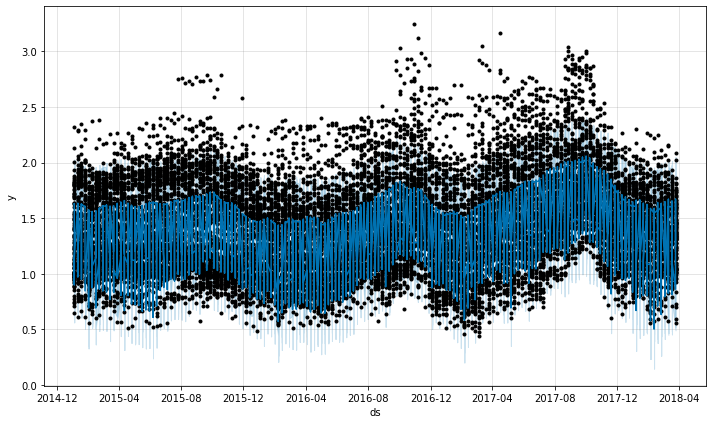

In [57]:
fig = m.plot(pred)

In [58]:
def plot_anomalies(forecasted):
    interval = alt.Chart(forecasted).mark_area(interpolate="basis", color = '#7FC97F').encode(
    x=alt.X('ds:T',  title ='date'),
    y='yhat_upper',
    y2='yhat_lower',
    tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive().properties(
        title='Anomaly Detection'
    )

    fact = alt.Chart(forecasted[forecasted.anomaly==0]).mark_circle(size=15, opacity=0.7, color = 'Black').encode(
        x='ds:T',
        y=alt.Y('fact', title='temp'),    
        tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper']
    ).interactive()

    anomalies = alt.Chart(forecasted[forecasted.anomaly!=0]).mark_circle(size=30, color = 'Red').encode(
        x='ds:T',
        y=alt.Y('fact', title='temp'),    
        tooltip=['ds', 'fact', 'yhat_lower', 'yhat_upper'],
        size = alt.Size( 'importance', legend=None)
    ).interactive()

    return alt.layer(interval, fact, anomalies)\
              .properties(width=870, height=450)\
              .configure_title(fontSize=20)

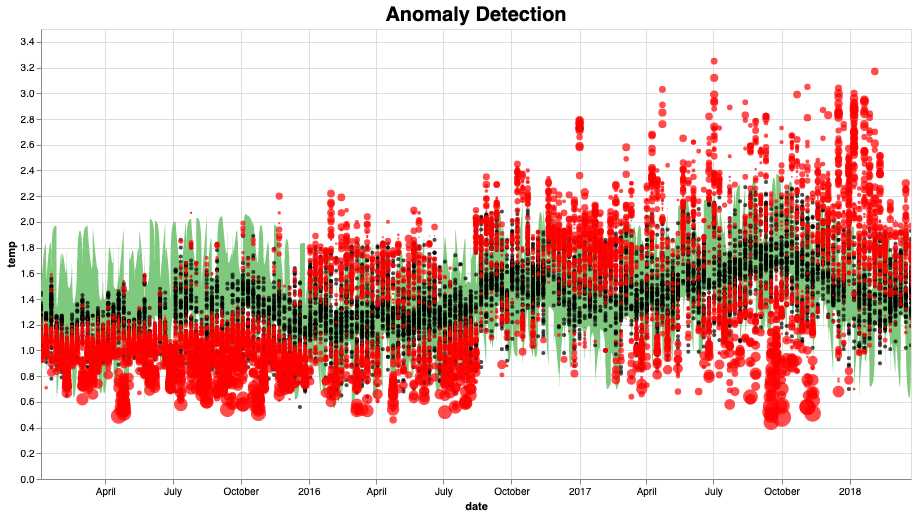

In [61]:
alt.data_transformers.disable_max_rows()

plot_anomalies(pred)